# Loading Modules

In [96]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from LogGabor import LogGabor
from what_where.main import init, MNIST
from what_where.where import RetinaFill, WhereShift, RetinaBackground, RetinaMask
from POLO.PYramid2 import cropped_pyramid, local_filter, get_K, log_gabor_transform
from POLO.PYramid2 import inverse_pyramid, get_K_inv, inverse_gabor
from utils import view_data
from typing import List, Tuple

In [97]:
#args.offset_std = 30
#args.contrast = 0.7

width = {'in': 32, 'out': 64}

n_levels = {'in': 3, 'out': 3} 

base_levels = 2

n_color = {'in': 3, 'out': 3}

color = True

color_mode= 'rgb' #'lab' # 'hsv' #True

r_min = {'in': width['in'] / 4, 'out': width['out'] / 4}

r_max = {'in': width['in'] / 2, 'out': width['out'] / 2}

n_sublevel = n_eccentricity = {'in': 2, 'out': 4}

n_azimuth = {'in': 16, 'out': 32}

n_theta = {'in': 8, 'out': 8}

n_phase = {'in': 1, 'out': 1}

do_mask = False

gauss = False






In [98]:
lg={}
for k in ['in', 'out']:
    pe = {'N_X': width[k], 'N_Y': width[k], 'do_mask': do_mask, 'base_levels':
              base_levels, 'n_theta': 0, 'B_sf': np.inf, 'B_theta': np.inf ,
          'use_cache': True, 'figpath': 'results', 'edgefigpath':
              'results/edges', 'matpath': 'cache_dir', 'edgematpath':
              'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize':
              14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}   

    lg[k] = LogGabor(pe)

In [99]:
K = {}
for k in ['in', 'out']:
    K[k] = get_K(width=width[k],
          n_sublevel = n_sublevel[k], 
          n_azimuth = n_azimuth[k], 
          n_theta = n_theta[k],
          n_phase = n_phase[k], 
          r_min = r_min[k], 
          r_max = r_max[k], 
          log_density_ratio = 2, 
          verbose=True,
          lg=lg[k])

i_sublevel, sf_0, radius 0 0.36067376022224085 8.0
i_sublevel, sf_0, radius 1 0.25503486164919736 11.31370849898476
K shape= torch.Size([32, 32, 2, 16, 8, 1])
K min max= tensor(-0.3125) tensor(1.)
i_sublevel, sf_0, radius 0 0.18033688011112042 16.0
i_sublevel, sf_0, radius 1 0.15164463602348005 19.027313840043536
i_sublevel, sf_0, radius 2 0.12751743082459868 22.62741699796952
i_sublevel, sf_0, radius 3 0.10722895046276856 26.908685288118864
K shape= torch.Size([64, 64, 4, 32, 8, 1])
K min max= tensor(-0.2759) tensor(1.)


In [100]:
K_inv={}
for k in ['in', 'out']:
    K_inv[k] = get_K_inv(K[k], 
                  width=width[k], 
                  n_sublevel = n_sublevel[k], 
                  n_azimuth = n_azimuth[k], 
                  n_theta = n_theta[k], 
                  n_phase = n_phase[k])

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 1])
Reshaped filter tensor= torch.Size([1024, 256])
Tensor shape= torch.Size([256, 1024])
Filter tensor shape= torch.Size([64, 64, 4, 32, 8, 1])
Reshaped filter tensor= torch.Size([4096, 1024])
Tensor shape= torch.Size([1024, 4096])


# Loading the Data

- Loading the data with the parameters given in the .json file for the What/Where model

In [101]:
args = init(filename='2020-07-01')
args

{'w': 28,
 'minibatch_size': 100,
 'train_batch_size': 50000,
 'test_batch_size': 10000,
 'noise_batch_size': 1000,
 'mean': 0.1307,
 'std': 0.3081,
 'what_offset_std': 15,
 'what_offset_max': 25,
 'N_pic': 128,
 'offset_std': 30,
 'offset_max': 34,
 'noise': 0.75,
 'contrast': 0.7,
 'sf_0': 0.1,
 'B_sf': 0.1,
 'do_mask': True,
 'N_theta': 6,
 'N_azimuth': 24,
 'N_eccentricity': 10,
 'N_phase': 2,
 'rho': 1.41,
 'bias_deconv': True,
 'p_dropout': 0.0,
 'dim1': 1000,
 'dim2': 1000,
 'lr': 0.005,
 'do_adam': True,
 'bn1_bn_momentum': 0.5,
 'bn2_bn_momentum': 0.5,
 'momentum': 0.3,
 'epochs': 60,
 'num_processes': 1,
 'no_cuda': False,
 'log_interval': 100,
 'verbose': 1,
 'filename': '../data/2020-07-01',
 'seed': 2019,
 'N_cv': 10,
 'do_compute': True,
 'save_model': True}

In [102]:
class DualCroppedPyramid(object):
    def __init__(self, width, 
                 base_levels, 
                 color=color, 
                 do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb'):
        self.width = width
        self.base_levels = base_levels
        self.color = color
        self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode

    def __call__(self, img):
        img_crop = {}
        for k in ['in', 'out']:
            img_crop_part, level_size = cropped_pyramid(img.unsqueeze(0), 
                                               width=self.width[k], 
                                               base_levels=self.base_levels,
                                               color=self.color, 
                                               do_mask=self.do_mask, 
                                               verbose=self.verbose,
                                               squeeze=True,
                                               gauss=gauss,
                                               n_levels=self.n_levels[k],
                                               color_mode=self.color_mode)
            #print(img_crop_part.shape)
            img_crop[k] = img_crop_part[:self.n_levels[k]-1,...]
        return img, img_crop   

### LogGaborTransform

In [103]:
class DualLogGaborTransform(object):
    def __init__(self, K=K, color=color, verbose=False):
        self.K = K
        self.color = color
        self.verbose = verbose

    def __call__(self, cropped_pyr):
        img = cropped_pyr[0]
        img_crop = cropped_pyr[1]
        log_gabor_coeffs = {}
        for k in ['in', 'out']:
            log_gabor_coeffs[k] = log_gabor_transform(img_crop[k].unsqueeze(1), K[k], color=self.color).squeeze(1)
        
        return img, log_gabor_coeffs

In [104]:
class DualLogGaborReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose

    def __call__(self, log_gabor_transform):
        img = log_gabor_transform[0]
        log_gabor_coeffs = log_gabor_transform[1]
        for k in ['in', 'out']:
            # n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase
            # x      , 0       , 1      , 2         , 3        , 4      , 5
            # 
            #print(log_gabor_coeffs[k].shape)
            log_gabor_coeffs[k] = log_gabor_coeffs[k].permute(1, 4, 5, 0, 2, 3).contiguous()
            log_gabor_coeffs[k] = log_gabor_coeffs[k].view(self.n_color[k]*self.n_theta[k]*self.n_phase[k], 
                                                     (self.n_levels[k]-1) * self.n_eccentricity[k], 
                                                     self.n_azimuth[k])
 
        return img, log_gabor_coeffs

In [105]:
class LogGaborInvReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):

        if self.verbose:
            print('log_gabor_coeffs.shape:', log_gabor_coeffs.shape)
        log_gabor_coeffs = log_gabor_coeffs.view(-1, 
                                                 self.n_color, 
                                                 self.n_theta, 
                                                 self.n_phase, 
                                                 self.n_levels, 
                                                 self.n_eccentricity, 
                                                 self.n_azimuth)
        log_gabor_coeffs = log_gabor_coeffs.permute(0, 4, 1, 5, 6, 2, 3).contiguous()
        return log_gabor_coeffs

In [106]:
class LogGaborInvTransform(object):
    def __init__(self, K_inv=K_inv, color=color, verbose=False):
        self.K_inv = K_inv
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):
        img_crop=inverse_gabor(log_gabor_coeffs[:, :, 0, ...].detach(), self.K_inv, self.verbose)
        if self.verbose:
            print('img_crop.shape:', img_crop.shape)

        return img_crop

In [107]:
class InvCroppedPyramid(object):
    def __init__(self, 
                 #width, 
                 base_levels, 
                 color=color, 
                 #do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb',
                 N_X = 128,
                 N_Y = 128):
        #self.width = width
        self.base_levels = base_levels
        self.color = color
        #self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode
        self.N_X = N_X
        self.N_Y = N_Y

    def __call__(self, img_crop):
        full_img_rec = inverse_pyramid(img_crop, 
                                       N_X = self.N_X,
                                       N_Y = self.N_Y,
                                       #width=self.width, 
                                       base_levels=self.base_levels,
                                       color=self.color, 
                                       #do_mask=self.do_mask, 
                                       verbose=self.verbose,
                                       #squeeze=True,
                                       gauss=gauss,
                                       n_levels=self.n_levels) #,
                                       #color_mode=self.color_mode)
        return full_img_rec

### Inverse transformations (for display only)

# Exploring the MNIST with where noise parameters and log polar encoding

- 128x128 pixel with shift, noise and circular mask

In [108]:
#args.offset_max = 40 #like in the paper

In [109]:
# normalization used to train VGG
# see https://pytorch.org/hub/pytorch_vision_vgg/
v_mean = np.array([0.485, 0.456, 0.406])
v_std = np.array([0.229, 0.224, 0.225])
transforms_norm = transforms.Normalize(mean=v_mean, std=v_std) # to normalize colors on the imagenet dataset



In [110]:
image_size = 256

transform_big =  transforms.Compose([
            transforms.Resize((int(image_size), int(image_size))),
            #transforms.AutoAugment(), # https://pytorch.org/vision/master/transforms.html#torchvision.transforms.AutoAugment
            transforms.ToTensor(),      # Convert the image to pyTorch Tensor data type.
            #transforms_norm, 
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [111]:
width,base_levels, color, n_levels

({'in': 32, 'out': 64}, 2, True, {'in': 3, 'out': 3})

In [112]:
image_path = "../data/animal/"

image_dataset = { 'train' : datasets.ImageFolder(
                            image_path+'train', 
                            transform=transform_big
                        ),
                  'test' : datasets.ImageFolder(
                            image_path+'test', 
                            transform=transform_big
                        )
                }

In [113]:
dataset_size = {'train' : len(image_dataset['train']),
                'test' : len(image_dataset['test'])}

dataset_size['train'], dataset_size['test']

(2000, 1200)

In [114]:
batch_size = 50
num_workers = 1

dataloader = { 'train' : torch.utils.data.DataLoader(
                            image_dataset['train'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        ),
               'test' : torch.utils.data.DataLoader(
                            image_dataset['test'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        )
             }

In [115]:
data, label = next(iter(dataloader['train']))

In [116]:
data_original = data[0]
data_polo = data[1]
data_original.shape, data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 3, 256, 256]),
 torch.Size([50, 24, 4, 16]),
 torch.Size([50, 24, 8, 32]))

In [117]:
# n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase

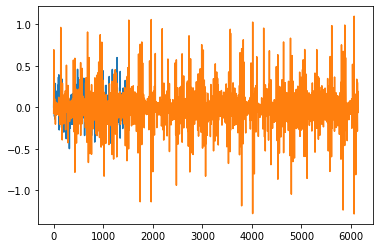

In [118]:
plt.plot(data_polo['in'][3,...].detach().numpy().flatten())
plt.plot(data_polo['out'][3,...].detach().numpy().flatten())


### Displaying Log Gabor Encoded visual field using pseudo-inverse transformation

In [119]:
inverse_transform = {}
for k in ['in', 'out']:
    N_X = N_Y = width[k] * 2**(n_levels[k]-1)
    print(N_X)
    inverse_transform[k] = transforms.Compose([
        LogGaborInvReshape(n_levels[k], n_color[k], n_eccentricity[k], n_azimuth[k], n_theta[k], n_phase[k], color=color, verbose=False),        
        LogGaborInvTransform(K_inv=K_inv[k], color=color, verbose=False),
        InvCroppedPyramid(base_levels, n_levels=n_levels[k], verbose=False, N_X=N_X, N_Y=N_Y),
    ])

128
256


- The Log-Polar compressed format

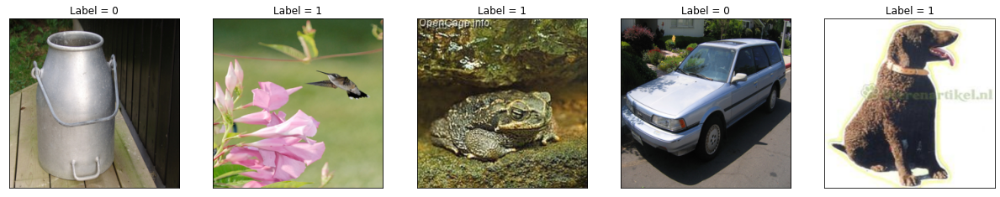

In [120]:
original = view_data(data_original, label, 5)

In [121]:
inverse_transform['in']

Compose(
)

- The original format

In [122]:
data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 24, 4, 16]), torch.Size([50, 24, 8, 32]))

# Creating an Attention Transformer model with log-polar entry (POLO-STN)

In [123]:
transform_in =  transforms.Compose([
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [124]:
def kl_divergence(model, z, mu, std):
    # --------------------------
    # Monte carlo KL divergence
    # --------------------------
    # 1. define the first two probabilities (in this case Normal for both)
    p = torch.distributions.Normal(torch.zeros_like(mu), args.std_sched * torch.ones_like(std))

    # 2. get the probabilities from the equation
    log_qzx = model.q.log_prob(z)
    log_pz = p.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    
    # sum over last dim to go from single dim distribution to multi-dim
    kl = model.LAMBDA * kl.sum()
    return kl

In [125]:
class Polo_AttentionTransNet(nn.Module):
    
    def __init__(self, do_stn=True, LAMBDA=.1):
        super(Polo_AttentionTransNet, self).__init__()
        
        self.do_stn = do_stn
        self.LAMBDA = LAMBDA

        ##  The what pathway
        self.wloc1 = nn.Conv2d(n_color['out'] * n_theta['out'] * n_phase['out'], 
                              50, 3, padding=1)
        self.wloc2a = nn.Conv2d(50, 100, 3, padding=1)
        self.wloc2b = nn.Conv2d(n_color['in'] * n_theta['in'] * n_phase['in'], 
                               50, 3, padding=1)
        self.wloc3 = nn.Linear((n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2 * (50+100), 
                              500)
        self.wloc4 = nn.Linear(500, 2)

        #self.wloc4.weight.data.zero_()
        #self.wloc4.bias.data.zero_()

                
        ##  The where pathway        
        self.loc1 = nn.Conv2d(n_color['out'] * n_theta['out'] * n_phase['out'], 
                              50, 5, padding=2, stride=2)
        self.loc2a = nn.Conv2d(50, 100, 5, padding=2,stride=2)
        self.loc2b = nn.Conv2d(n_color['in'] * n_theta['in'] * n_phase['in'], 
                               50, 5, padding=2,stride=2)
        self.loc3 = nn.Linear((n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2 * (50+100), 
                              500)
        self.mu = nn.Linear(500, 2) #, bias=False)
        self.logvar = nn.Linear(500, 2) #, bias=False)
        
        

        #self.loc4.weight.data.zero_()
        #self.loc4.bias.data.zero_()

        self.downscale = nn.Parameter(torch.tensor([[1, 0], [0, 1]],
                                                   dtype=torch.float),
                                      requires_grad=False)

    def stn(self: object, x: torch.Tensor, x_polo: torch.Tensor) -> Tuple[torch.Tensor]:
    
        if self.do_stn:
            xs_part = {}
            #for k in ['in', 'out']:
            #    print(x_polo[k].shape)
            #    xs_part[k] = x_polo[k].permute(0,2,5,6,1,3,4)
            #    xs_part[k] = xs_part[k].view(-1, n_color[k] * n_theta[k] * n_phase[k], 
            #                                 (n_levels[k]-1) * n_eccentricity[k], 
            #                                 n_azimuth[k])

            #print(x_polo['out'].shape)

            if True: #with torch.no_grad():
                xs = F.relu(self.loc1(x_polo['out']))
                #xs = nn.MaxPool2d(2)(xs)        

                #print(xs.shape)

                xsa = F.relu(self.loc2a(xs))
                #xsa = nn.MaxPool2d(2)(xsa)

                #print(xsa.shape)

                xsb = F.relu(self.loc2b(x_polo['in']))
                #xsb = nn.MaxPool2d(2)(xsb)

                #print(xsb.shape)

                xs = torch.cat((xsa, xsb), dim=1)
            xs = F.relu(self.loc3(xs.view(-1, 
                                          (50+100) * (n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2)))
            #theta = F.sigmoid(self.loc4(xs)) - 0.5
            #theta = self.loc4(xs)
            mu = self.mu(xs)
            logvar = self.logvar(xs) + 3
            sigma = torch.exp(-logvar / 2)
            self.q = torch.distributions.Normal(mu, sigma)
            z = self.q.rsample()
            print(z[0,...])
            theta = torch.cat((self.downscale.unsqueeze(0).repeat(
                                z.size(0), 1, 1), z.unsqueeze(2)),
                                  dim=2)
        
            grid_size = torch.Size([x.size()[0], x.size()[1], 256, 256])
            grid = F.affine_grid(theta, grid_size)
            x = F.grid_sample(x, grid)

        else:
            theta = nn.Parameter(torch.tensor([[1, 0, 0], [0, 1, 0]],
                                                   dtype=torch.float),
                                      requires_grad=False)
            theta = theta.unsqueeze(0).repeat(x.size()[0], 1, 1)
            z = torch.tensor([0, 0],dtype=torch.float)
            z = z.unsqueeze(0).repeat(x.size()[0], 1)
            mu = torch.tensor([0, 0],dtype=torch.float)
            mu = mu.unsqueeze(0).repeat(x.size()[0], 1)   
            sigma = torch.tensor([1, 1],dtype=torch.float)
            sigma = sigma.unsqueeze(0).repeat(x.size()[0], 1)      
        return x, theta, z, mu, sigma

    def forward(self, x, x_polo):
        # transform the input
        x, theta, z, mu, sigma = self.stn(x, x_polo)
        
        if self.do_stn:
        
            w_x_polo ={'in': torch.zeros_like(x_polo['in']),
                       'out': torch.zeros_like(x_polo['out'])}
            for i in range(batch_size):
                d, w = transform_in(x[i,...])
                w_x_polo['in'][i,...] = w['in']
                w_x_polo['out'][i,...] = w['out']
        else:
            w_x_polo = x_polo
                                           

        # print(x.shape)
        # Perform the usual forward pass
        ya = F.relu(self.wloc1(w_x_polo['out']))
        ya = nn.MaxPool2d(2)(ya)        
        
        #print(xs.shape)
        
        ya = F.relu(self.wloc2a(ya))
        ya = nn.MaxPool2d(2)(ya)
        
        #print(xsa.shape)
        
        yb = F.relu(self.wloc2b(w_x_polo['in']))
        yb = nn.MaxPool2d(2)(yb)
        
        #print(xsb.shape)

        y = torch.cat((ya, yb), dim=1)
        y = F.relu(self.wloc3(y.view(-1, (50+100) * (n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2)))
        y = self.wloc4(y)
        return y, theta, z, mu, sigma



In [140]:
def train(epoch, loader):
    model.train()
    for batch_idx, (data, target) in enumerate(loader):

        data_original, data_polo = data[0], data[1]
        data_original, data_polo['in'], data_polo['out'], target = data_original.to(
            device, dtype=torch.double), data_polo['in'].to(
                device, dtype=torch.double), data_polo['out'].to(
                device, dtype=torch.double), target.to(device)

        optimizer.zero_grad()
        output, theta, z, mu, sigma = model(data_original, data_polo)
        if model.do_stn :
            loss = loss_func(output, target) + kl_divergence(model, z, mu, sigma)
        else:
            loss = loss_func(output, target)
        loss.backward()
        optimizer.step()
        if True: #batch_idx % args.log_interval == 0:
            print(f"KL loss : {kl_divergence(model, z, mu, sigma).item()}")
            print('Train Epoch: {}/{} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, args.epochs, batch_idx * len(data_original),
                len(dataloader['train'].dataset),
                100. * batch_idx / len(dataloader['train']), loss.item()))


def test(loader):
    with torch.no_grad():
        model.eval()
        test_loss = 0
        kl_loss = 0
        correct = 0
        for data, target in loader:
            data_original, data_polo = data[0], data[1]
            data_original = data_original.to(device, dtype=torch.double)            
            data_polo['in'] = data_polo['in'].to(device, dtype=torch.double) 
            data_polo['out'] = data_polo['out'].to(device, dtype=torch.double) 
            target = target.to(device)

            output, theta, z, mu, sigma = model(data_original, data_polo)

            # sum up batch loss
            #test_loss += F.nll_loss(output, target, size_average=False).item()
            test_loss += loss_func(output, target).item()
            kl_loss += kl_divergence(model, z, mu, sigma).item()
            # get the index of the max log-probability
            #pred = output.max(1, keepdim=True)[1]
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(dataloader['test'].dataset)
        kl_loss /= len(dataloader['test'].dataset)
        print('\nTest set: CE loss: {:.4f}, Accuracy: {}/{} ({:.0f}%), KL loss: {:.4f}\n'.
              format(test_loss, correct, len(dataloader['test'].dataset),
                     100. * correct / len(dataloader['test'].dataset),
                     kl_loss))
        return correct / len(dataloader['test'].dataset), test_loss, kl_loss

# Training 

In [185]:
lr = 1e-4
LAMBDA = 1e-6

In [186]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = torch.load("../models/low_comp_polo_stn.pt")
model = Polo_AttentionTransNet(LAMBDA=LAMBDA).to(device)

In [187]:
optimizer = optim.Adam(model.parameters(), lr=lr)
#optimizer = optim.SGD(model.parameters(), lr=lr)
loss_func = nn.CrossEntropyLoss()
#scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.9, last_epoch=-1) #, verbose=True)

In [188]:
acc = []
loss = []
kl_loss = []


In [189]:
args.epochs = 100
model.do_stn = True
log_std_min = -6
log_std_max = -0.3

std_axe = np.exp(np.linspace(log_std_min, log_std_max, args.epochs))

for epoch in range(args.epochs):
    args.std_sched = std_axe[epoch]
    train(epoch, dataloader['train'])
    curr_acc, curr_loss, curr_kl_loss = test(dataloader['test'])
    acc.append(curr_acc)
    loss.append(curr_loss)
    kl_loss.append(curr_kl_loss)

tensor([-0.0668,  0.2234], grad_fn=<SelectBackward0>)
KL loss : 0.3778533273498006
Train Epoch: 0/100 [0/2000 (0%)]	Loss: 1.071037
tensor([-0.4948, -0.2537], grad_fn=<SelectBackward0>)
KL loss : 0.4416368749858923
Train Epoch: 0/100 [50/2000 (2%)]	Loss: 1.138156
tensor([0.2181, 0.1876], grad_fn=<SelectBackward0>)
KL loss : 0.3906571739758379
Train Epoch: 0/100 [100/2000 (5%)]	Loss: 1.083306
tensor([ 0.0919, -0.1229], grad_fn=<SelectBackward0>)
KL loss : 0.33659649526578217
Train Epoch: 0/100 [150/2000 (8%)]	Loss: 1.027270
tensor([ 0.1170, -0.2423], grad_fn=<SelectBackward0>)
KL loss : 0.32234475873065155
Train Epoch: 0/100 [200/2000 (10%)]	Loss: 1.022293
tensor([ 0.2357, -0.5482], grad_fn=<SelectBackward0>)
KL loss : 0.4952761170095037
Train Epoch: 0/100 [250/2000 (12%)]	Loss: 1.188616
tensor([ 0.0932, -0.1756], grad_fn=<SelectBackward0>)
KL loss : 0.33359735460669176
Train Epoch: 0/100 [300/2000 (15%)]	Loss: 1.031578
tensor([-0.0251,  0.2862], grad_fn=<SelectBackward0>)
KL loss : 0.35

KL loss : 0.0897431198267378
Train Epoch: 1/100 [800/2000 (40%)]	Loss: 0.770806
tensor([ 0.0739, -0.0700], grad_fn=<SelectBackward0>)
KL loss : 0.07597026725389075
Train Epoch: 1/100 [850/2000 (42%)]	Loss: 0.760250
tensor([-0.1391,  0.0672], grad_fn=<SelectBackward0>)
KL loss : 0.12415987971526102
Train Epoch: 1/100 [900/2000 (45%)]	Loss: 0.810599
tensor([-0.1217, -0.0492], grad_fn=<SelectBackward0>)
KL loss : 0.12107257683884017
Train Epoch: 1/100 [950/2000 (48%)]	Loss: 0.802863
tensor([-0.0822, -0.1322], grad_fn=<SelectBackward0>)
KL loss : 0.12360720131952925
Train Epoch: 1/100 [1000/2000 (50%)]	Loss: 0.809484
tensor([-0.0354, -0.1656], grad_fn=<SelectBackward0>)
KL loss : 0.10109917602512344
Train Epoch: 1/100 [1050/2000 (52%)]	Loss: 0.807974
tensor([-0.2193, -0.1813], grad_fn=<SelectBackward0>)
KL loss : 0.11836084899056604
Train Epoch: 1/100 [1100/2000 (55%)]	Loss: 0.828609
tensor([-0.1944, -0.0078], grad_fn=<SelectBackward0>)
KL loss : 0.09465859953790458
Train Epoch: 1/100 [115

KL loss : 0.08927929302593443
Train Epoch: 2/100 [1600/2000 (80%)]	Loss: 0.772471
tensor([0.0656, 0.0189], grad_fn=<SelectBackward0>)
KL loss : 0.06253305883699221
Train Epoch: 2/100 [1650/2000 (82%)]	Loss: 0.727868
tensor([-0.0060,  0.2191], grad_fn=<SelectBackward0>)
KL loss : 0.07831274506630784
Train Epoch: 2/100 [1700/2000 (85%)]	Loss: 0.730804
tensor([0.1346, 0.2970], grad_fn=<SelectBackward0>)
KL loss : 0.08037884524429906
Train Epoch: 2/100 [1750/2000 (88%)]	Loss: 0.751551
tensor([0.0152, 0.1840], grad_fn=<SelectBackward0>)
KL loss : 0.08101370683273869
Train Epoch: 2/100 [1800/2000 (90%)]	Loss: 0.737061
tensor([0.0317, 0.0695], grad_fn=<SelectBackward0>)
KL loss : 0.04407000513359829
Train Epoch: 2/100 [1850/2000 (92%)]	Loss: 0.741718
tensor([ 0.0920, -0.1277], grad_fn=<SelectBackward0>)
KL loss : 0.04092835434760148
Train Epoch: 2/100 [1900/2000 (95%)]	Loss: 0.706958
tensor([-0.0176, -0.0224], grad_fn=<SelectBackward0>)
KL loss : 0.07520069931989762
Train Epoch: 2/100 [1950/2

KeyboardInterrupt: 

In [202]:
args.epochs = 100
model.do_stn = True
log_std_min = -6
log_std_max = -0.3

std_axe = np.exp(np.linspace(log_std_min, log_std_max, args.epochs))

for epoch in range(5, args.epochs):
    args.std_sched = std_axe[epoch]
    train(epoch, dataloader['train'])
    curr_acc, curr_loss, curr_kl_loss = test(dataloader['test'])
    acc.append(curr_acc)
    loss.append(curr_loss)
    kl_loss.append(curr_kl_loss)

tensor([-0.0668, -0.0024], grad_fn=<SelectBackward0>)
KL loss : 0.03386476902434836
Train Epoch: 5/100 [0/2000 (0%)]	Loss: 0.724022
tensor([-0.0741, -0.0564], grad_fn=<SelectBackward0>)
KL loss : 0.02899993254473449
Train Epoch: 5/100 [50/2000 (2%)]	Loss: 0.712577
tensor([ 0.0102, -0.0098], grad_fn=<SelectBackward0>)
KL loss : 0.027080152752915726
Train Epoch: 5/100 [100/2000 (5%)]	Loss: 0.707407
tensor([0.0262, 0.0590], grad_fn=<SelectBackward0>)
KL loss : 0.027430659229638308
Train Epoch: 5/100 [150/2000 (8%)]	Loss: 0.696169
tensor([ 0.0539, -0.0973], grad_fn=<SelectBackward0>)
KL loss : 0.02974806695629253
Train Epoch: 5/100 [200/2000 (10%)]	Loss: 0.715863
tensor([ 0.0943, -0.1768], grad_fn=<SelectBackward0>)
KL loss : 0.03263748429944017
Train Epoch: 5/100 [250/2000 (12%)]	Loss: 0.696005
tensor([ 0.1462, -0.1606], grad_fn=<SelectBackward0>)
KL loss : 0.034546117959390464
Train Epoch: 5/100 [300/2000 (15%)]	Loss: 0.721308
tensor([0.0388, 0.0494], grad_fn=<SelectBackward0>)
KL loss :

KL loss : 0.12408554423786121
Train Epoch: 6/100 [750/2000 (38%)]	Loss: 0.773681
tensor([0.0191, 0.1919], grad_fn=<SelectBackward0>)
KL loss : 0.11321558371507634
Train Epoch: 6/100 [800/2000 (40%)]	Loss: 0.799613
tensor([0.0742, 0.3003], grad_fn=<SelectBackward0>)
KL loss : 0.14186870417622569
Train Epoch: 6/100 [850/2000 (42%)]	Loss: 0.789451
tensor([0.0268, 0.1802], grad_fn=<SelectBackward0>)
KL loss : 0.1252304407778717
Train Epoch: 6/100 [900/2000 (45%)]	Loss: 0.839453
tensor([0.0547, 0.0827], grad_fn=<SelectBackward0>)
KL loss : 0.14196974909807228
Train Epoch: 6/100 [950/2000 (48%)]	Loss: 0.822047
tensor([-0.0942,  0.0731], grad_fn=<SelectBackward0>)
KL loss : 0.11256527154131794
Train Epoch: 6/100 [1000/2000 (50%)]	Loss: 0.817573
tensor([-0.0125,  0.2298], grad_fn=<SelectBackward0>)
KL loss : 0.08220488139559777
Train Epoch: 6/100 [1050/2000 (52%)]	Loss: 0.760434
tensor([0.0324, 0.1830], grad_fn=<SelectBackward0>)
KL loss : 0.09577610109389244
Train Epoch: 6/100 [1100/2000 (55%

KL loss : 0.045761206246573
Train Epoch: 7/100 [1550/2000 (78%)]	Loss: 0.709943
tensor([-0.1267,  0.1001], grad_fn=<SelectBackward0>)
KL loss : 0.03942001647066119
Train Epoch: 7/100 [1600/2000 (80%)]	Loss: 0.699543
tensor([-0.0215,  0.1844], grad_fn=<SelectBackward0>)
KL loss : 0.03637221059119093
Train Epoch: 7/100 [1650/2000 (82%)]	Loss: 0.658887
tensor([-0.1431,  0.0984], grad_fn=<SelectBackward0>)
KL loss : 0.04028615806891349
Train Epoch: 7/100 [1700/2000 (85%)]	Loss: 0.731352
tensor([-0.1839,  0.0894], grad_fn=<SelectBackward0>)
KL loss : 0.035976143682078514
Train Epoch: 7/100 [1750/2000 (88%)]	Loss: 0.711121
tensor([-0.1588,  0.0611], grad_fn=<SelectBackward0>)
KL loss : 0.034592251786817
Train Epoch: 7/100 [1800/2000 (90%)]	Loss: 0.713493
tensor([-0.1267,  0.1149], grad_fn=<SelectBackward0>)
KL loss : 0.028420790811682882
Train Epoch: 7/100 [1850/2000 (92%)]	Loss: 0.691173
tensor([-0.1272, -0.0135], grad_fn=<SelectBackward0>)
KL loss : 0.034128029434487214
Train Epoch: 7/100 

KL loss : 0.05933517091717365
Train Epoch: 9/100 [50/2000 (2%)]	Loss: 0.686625
tensor([-0.0975,  0.0082], grad_fn=<SelectBackward0>)
KL loss : 0.055951024612795996
Train Epoch: 9/100 [100/2000 (5%)]	Loss: 0.700744
tensor([-0.1671,  0.0349], grad_fn=<SelectBackward0>)
KL loss : 0.06265546358522674
Train Epoch: 9/100 [150/2000 (8%)]	Loss: 0.729648
tensor([-0.0201,  0.0731], grad_fn=<SelectBackward0>)
KL loss : 0.07412233535507134
Train Epoch: 9/100 [200/2000 (10%)]	Loss: 0.702975
tensor([-0.0411,  0.1028], grad_fn=<SelectBackward0>)
KL loss : 0.08244101024693182
Train Epoch: 9/100 [250/2000 (12%)]	Loss: 0.742056
tensor([-0.2088, -0.0482], grad_fn=<SelectBackward0>)
KL loss : 0.0580121099381835
Train Epoch: 9/100 [300/2000 (15%)]	Loss: 0.756040
tensor([-0.0610,  0.0673], grad_fn=<SelectBackward0>)
KL loss : 0.05629165023283427
Train Epoch: 9/100 [350/2000 (18%)]	Loss: 0.721278
tensor([0.0127, 0.0310], grad_fn=<SelectBackward0>)
KL loss : 0.04324576929682816
Train Epoch: 9/100 [400/2000 (2

KL loss : 0.047515011532127824
Train Epoch: 10/100 [850/2000 (42%)]	Loss: 0.707812
tensor([-0.1785,  0.0108], grad_fn=<SelectBackward0>)
KL loss : 0.04528275029595383
Train Epoch: 10/100 [900/2000 (45%)]	Loss: 0.661184
tensor([-0.3630,  0.1102], grad_fn=<SelectBackward0>)
KL loss : 0.04307990488458962
Train Epoch: 10/100 [950/2000 (48%)]	Loss: 0.700289
tensor([ 0.0441, -0.1521], grad_fn=<SelectBackward0>)
KL loss : 0.03855382732591759
Train Epoch: 10/100 [1000/2000 (50%)]	Loss: 0.662345
tensor([0.2541, 0.0202], grad_fn=<SelectBackward0>)
KL loss : 0.0455641290462099
Train Epoch: 10/100 [1050/2000 (52%)]	Loss: 0.718983
tensor([ 0.1552, -0.1534], grad_fn=<SelectBackward0>)
KL loss : 0.043584544951978416
Train Epoch: 10/100 [1100/2000 (55%)]	Loss: 0.694711
tensor([ 0.2487, -0.3233], grad_fn=<SelectBackward0>)
KL loss : 0.053507944840178595
Train Epoch: 10/100 [1150/2000 (58%)]	Loss: 0.738889
tensor([-0.0917, -0.4441], grad_fn=<SelectBackward0>)
KL loss : 0.05058343037903927
Train Epoch: 1

KL loss : 0.055727449531398375
Train Epoch: 11/100 [1600/2000 (80%)]	Loss: 0.620995
tensor([0.0058, 0.1846], grad_fn=<SelectBackward0>)
KL loss : 0.051623701655063046
Train Epoch: 11/100 [1650/2000 (82%)]	Loss: 0.631071
tensor([-0.0794, -0.1336], grad_fn=<SelectBackward0>)
KL loss : 0.05484578488821807
Train Epoch: 11/100 [1700/2000 (85%)]	Loss: 0.694774
tensor([-0.1838,  0.0297], grad_fn=<SelectBackward0>)
KL loss : 0.03891462046906134
Train Epoch: 11/100 [1750/2000 (88%)]	Loss: 0.679105
tensor([-0.1046, -0.1207], grad_fn=<SelectBackward0>)
KL loss : 0.06174532603813375
Train Epoch: 11/100 [1800/2000 (90%)]	Loss: 0.697284
tensor([-0.2406,  0.1146], grad_fn=<SelectBackward0>)
KL loss : 0.052266145274360395
Train Epoch: 11/100 [1850/2000 (92%)]	Loss: 0.689255
tensor([-0.2614, -0.0030], grad_fn=<SelectBackward0>)
KL loss : 0.04844217481606541
Train Epoch: 11/100 [1900/2000 (95%)]	Loss: 0.693791
tensor([-0.3012, -0.0046], grad_fn=<SelectBackward0>)
KL loss : 0.046892298267161805
Train Epo

KL loss : 0.02486148860268736
Train Epoch: 13/100 [100/2000 (5%)]	Loss: 0.606456
tensor([-0.1026,  0.0967], grad_fn=<SelectBackward0>)
KL loss : 0.026455273422780035
Train Epoch: 13/100 [150/2000 (8%)]	Loss: 0.591761
tensor([-0.0725, -0.0878], grad_fn=<SelectBackward0>)
KL loss : 0.022488477154452447
Train Epoch: 13/100 [200/2000 (10%)]	Loss: 0.684039
tensor([-0.0459, -0.1046], grad_fn=<SelectBackward0>)
KL loss : 0.028307118988151005
Train Epoch: 13/100 [250/2000 (12%)]	Loss: 0.667114
tensor([-0.0296, -0.0077], grad_fn=<SelectBackward0>)
KL loss : 0.029416646264892363
Train Epoch: 13/100 [300/2000 (15%)]	Loss: 0.655640
tensor([ 0.0247, -0.0735], grad_fn=<SelectBackward0>)
KL loss : 0.03139309837700505
Train Epoch: 13/100 [350/2000 (18%)]	Loss: 0.624488
tensor([0.1055, 0.1539], grad_fn=<SelectBackward0>)
KL loss : 0.03797680428965147
Train Epoch: 13/100 [400/2000 (20%)]	Loss: 0.693252
tensor([-0.1243, -0.2118], grad_fn=<SelectBackward0>)
KL loss : 0.0337320391159456
Train Epoch: 13/100

KL loss : 0.04044030308573128
Train Epoch: 14/100 [900/2000 (45%)]	Loss: 0.746054
tensor([ 0.3354, -0.1045], grad_fn=<SelectBackward0>)
KL loss : 0.04367355316159313
Train Epoch: 14/100 [950/2000 (48%)]	Loss: 0.693432
tensor([0.3411, 0.0142], grad_fn=<SelectBackward0>)
KL loss : 0.0359543207033203
Train Epoch: 14/100 [1000/2000 (50%)]	Loss: 0.692223
tensor([0.1141, 0.1973], grad_fn=<SelectBackward0>)
KL loss : 0.0336973972694143
Train Epoch: 14/100 [1050/2000 (52%)]	Loss: 0.688139
tensor([ 0.0147, -0.1491], grad_fn=<SelectBackward0>)
KL loss : 0.039642206013870036
Train Epoch: 14/100 [1100/2000 (55%)]	Loss: 0.618442
tensor([ 0.1206, -0.0993], grad_fn=<SelectBackward0>)
KL loss : 0.041309999552313785
Train Epoch: 14/100 [1150/2000 (58%)]	Loss: 0.673788
tensor([0.1815, 0.1469], grad_fn=<SelectBackward0>)
KL loss : 0.033584687459021496
Train Epoch: 14/100 [1200/2000 (60%)]	Loss: 0.653682
tensor([ 0.0623, -0.0170], grad_fn=<SelectBackward0>)
KL loss : 0.03628885851905061
Train Epoch: 14/10

KL loss : 0.04429638696133966
Train Epoch: 15/100 [1700/2000 (85%)]	Loss: 0.589655
tensor([0.1278, 0.0877], grad_fn=<SelectBackward0>)
KL loss : 0.056816705331206946
Train Epoch: 15/100 [1750/2000 (88%)]	Loss: 0.663106
tensor([0.0049, 0.1596], grad_fn=<SelectBackward0>)
KL loss : 0.05236032361200846
Train Epoch: 15/100 [1800/2000 (90%)]	Loss: 0.707015
tensor([-0.1022, -0.0279], grad_fn=<SelectBackward0>)
KL loss : 0.067533904060211
Train Epoch: 15/100 [1850/2000 (92%)]	Loss: 0.602627
tensor([0.1703, 0.3400], grad_fn=<SelectBackward0>)
KL loss : 0.07217216105803838
Train Epoch: 15/100 [1900/2000 (95%)]	Loss: 0.657449
tensor([0.1536, 0.3529], grad_fn=<SelectBackward0>)
KL loss : 0.06908096843015415
Train Epoch: 15/100 [1950/2000 (98%)]	Loss: 0.714566
tensor([0.0109, 0.0399])
tensor([0.1765, 0.2323])
tensor([0.1565, 0.0444])
tensor([0.0603, 0.1181])
tensor([0.0074, 0.2765])
tensor([-0.0562,  0.2784])
tensor([0.1578, 0.0055])
tensor([0.0422, 0.3945])
tensor([0.1859, 0.1989])
tensor([0.1055

KL loss : 0.020308540061721052
Train Epoch: 17/100 [250/2000 (12%)]	Loss: 0.646778
tensor([-0.2404,  0.0408], grad_fn=<SelectBackward0>)
KL loss : 0.02679226132878978
Train Epoch: 17/100 [300/2000 (15%)]	Loss: 0.563167
tensor([-0.1375, -0.0170], grad_fn=<SelectBackward0>)
KL loss : 0.024089319651945117
Train Epoch: 17/100 [350/2000 (18%)]	Loss: 0.655048
tensor([ 0.1085, -0.0225], grad_fn=<SelectBackward0>)
KL loss : 0.026244842556018565
Train Epoch: 17/100 [400/2000 (20%)]	Loss: 0.645888
tensor([-0.1605, -0.0266], grad_fn=<SelectBackward0>)
KL loss : 0.028116893173950285
Train Epoch: 17/100 [450/2000 (22%)]	Loss: 0.604060
tensor([-0.0682, -0.0903], grad_fn=<SelectBackward0>)
KL loss : 0.030885607250435994
Train Epoch: 17/100 [500/2000 (25%)]	Loss: 0.704053
tensor([-0.3464, -0.0903], grad_fn=<SelectBackward0>)
KL loss : 0.02941037329320902
Train Epoch: 17/100 [550/2000 (28%)]	Loss: 0.576973
tensor([-0.2511, -0.0546], grad_fn=<SelectBackward0>)
KL loss : 0.03135951407146271
Train Epoch: 

KL loss : 0.027086393344863704
Train Epoch: 18/100 [1000/2000 (50%)]	Loss: 0.504980
tensor([-0.0578, -0.0369], grad_fn=<SelectBackward0>)
KL loss : 0.021098991493283616
Train Epoch: 18/100 [1050/2000 (52%)]	Loss: 0.689394
tensor([-0.2383, -0.0662], grad_fn=<SelectBackward0>)
KL loss : 0.02585946122479141
Train Epoch: 18/100 [1100/2000 (55%)]	Loss: 0.635037
tensor([-0.1083,  0.2187], grad_fn=<SelectBackward0>)
KL loss : 0.028266697055592753
Train Epoch: 18/100 [1150/2000 (58%)]	Loss: 0.669583
tensor([-0.1378,  0.0178], grad_fn=<SelectBackward0>)
KL loss : 0.026804520555494475
Train Epoch: 18/100 [1200/2000 (60%)]	Loss: 0.703094
tensor([-0.0773,  0.2098], grad_fn=<SelectBackward0>)
KL loss : 0.03170212937593285
Train Epoch: 18/100 [1250/2000 (62%)]	Loss: 0.613684
tensor([0.2612, 0.1863], grad_fn=<SelectBackward0>)
KL loss : 0.030763770463782078
Train Epoch: 18/100 [1300/2000 (65%)]	Loss: 0.622185
tensor([-0.1680,  0.0091], grad_fn=<SelectBackward0>)
KL loss : 0.02550262351232762
Train Ep

KL loss : 0.03780445314258913
Train Epoch: 19/100 [1750/2000 (88%)]	Loss: 0.605632
tensor([ 0.1507, -0.0624], grad_fn=<SelectBackward0>)
KL loss : 0.036465591783327485
Train Epoch: 19/100 [1800/2000 (90%)]	Loss: 0.693178
tensor([-0.0845,  0.1355], grad_fn=<SelectBackward0>)
KL loss : 0.03301457248981115
Train Epoch: 19/100 [1850/2000 (92%)]	Loss: 0.632088
tensor([ 0.0338, -0.0513], grad_fn=<SelectBackward0>)
KL loss : 0.0200126014826495
Train Epoch: 19/100 [1900/2000 (95%)]	Loss: 0.549847
tensor([ 0.0043, -0.2606], grad_fn=<SelectBackward0>)
KL loss : 0.03371187685966844
Train Epoch: 19/100 [1950/2000 (98%)]	Loss: 0.680877
tensor([ 0.1065, -0.3070])
tensor([-0.0620, -0.1882])
tensor([ 0.1722, -0.2399])
tensor([-0.0378, -0.1211])
tensor([-0.1429, -0.2909])
tensor([-0.3547, -0.1248])
tensor([-0.2050, -0.0605])
tensor([-0.0738, -0.1777])
tensor([ 0.2049, -0.1936])
tensor([0.0810, 0.0030])
tensor([-0.1938, -0.3103])
tensor([ 0.0243, -0.5189])
tensor([ 0.1071, -0.0493])
tensor([-0.3820,  0.

KL loss : 0.02139642044915048
Train Epoch: 21/100 [250/2000 (12%)]	Loss: 0.673249
tensor([0.0344, 0.2292], grad_fn=<SelectBackward0>)
KL loss : 0.019940387374997065
Train Epoch: 21/100 [300/2000 (15%)]	Loss: 0.657243
tensor([0.0468, 0.2477], grad_fn=<SelectBackward0>)
KL loss : 0.019928420755536715
Train Epoch: 21/100 [350/2000 (18%)]	Loss: 0.718126
tensor([-0.1346, -0.0472], grad_fn=<SelectBackward0>)
KL loss : 0.020898631689148274
Train Epoch: 21/100 [400/2000 (20%)]	Loss: 0.711447
tensor([ 0.1101, -0.0460], grad_fn=<SelectBackward0>)
KL loss : 0.019087018639442416
Train Epoch: 21/100 [450/2000 (22%)]	Loss: 0.549654
tensor([-0.0240,  0.0352], grad_fn=<SelectBackward0>)
KL loss : 0.021667610528952122
Train Epoch: 21/100 [500/2000 (25%)]	Loss: 0.651411
tensor([0.0742, 0.4424], grad_fn=<SelectBackward0>)
KL loss : 0.024228993845547702
Train Epoch: 21/100 [550/2000 (28%)]	Loss: 0.617115
tensor([-0.1087,  0.2826], grad_fn=<SelectBackward0>)
KL loss : 0.021116953988335244
Train Epoch: 21/1

KL loss : 0.023916504548831815
Train Epoch: 22/100 [1000/2000 (50%)]	Loss: 0.554758
tensor([0.1424, 0.2422], grad_fn=<SelectBackward0>)
KL loss : 0.024329007525319312
Train Epoch: 22/100 [1050/2000 (52%)]	Loss: 0.638276
tensor([0.0034, 0.1658], grad_fn=<SelectBackward0>)
KL loss : 0.016083837905969775
Train Epoch: 22/100 [1100/2000 (55%)]	Loss: 0.515174
tensor([ 0.0824, -0.2517], grad_fn=<SelectBackward0>)
KL loss : 0.01963971696053619
Train Epoch: 22/100 [1150/2000 (58%)]	Loss: 0.640855
tensor([-0.0588,  0.0569], grad_fn=<SelectBackward0>)
KL loss : 0.016837329129097175
Train Epoch: 22/100 [1200/2000 (60%)]	Loss: 0.608316
tensor([-0.0570,  0.1903], grad_fn=<SelectBackward0>)
KL loss : 0.02279804755041701
Train Epoch: 22/100 [1250/2000 (62%)]	Loss: 0.609248
tensor([-0.0582, -0.0021], grad_fn=<SelectBackward0>)
KL loss : 0.018047404408215006
Train Epoch: 22/100 [1300/2000 (65%)]	Loss: 0.559709
tensor([-0.2848, -0.0949], grad_fn=<SelectBackward0>)
KL loss : 0.020992833909364496
Train Epo

KL loss : 0.02549938850398654
Train Epoch: 23/100 [1750/2000 (88%)]	Loss: 0.631654
tensor([0.0419, 0.0046], grad_fn=<SelectBackward0>)
KL loss : 0.02683230536728957
Train Epoch: 23/100 [1800/2000 (90%)]	Loss: 0.610241
tensor([-0.0818,  0.2100], grad_fn=<SelectBackward0>)
KL loss : 0.021984198702746344
Train Epoch: 23/100 [1850/2000 (92%)]	Loss: 0.653879
tensor([0.0820, 0.1934], grad_fn=<SelectBackward0>)
KL loss : 0.024108859085891634
Train Epoch: 23/100 [1900/2000 (95%)]	Loss: 0.617818
tensor([0.0836, 0.0217], grad_fn=<SelectBackward0>)
KL loss : 0.021379641774115637
Train Epoch: 23/100 [1950/2000 (98%)]	Loss: 0.561789
tensor([0.1105, 0.0313])
tensor([0.0476, 0.2061])
tensor([ 0.0296, -0.0919])
tensor([-0.1446,  0.0500])
tensor([0.0433, 0.0962])
tensor([-0.1771,  0.1065])
tensor([0.0239, 0.1155])
tensor([0.2623, 0.2645])
tensor([-0.0769,  0.1894])
tensor([0.2477, 0.2216])
tensor([ 0.0431, -0.1920])
tensor([0.1789, 0.0252])
tensor([-0.0450,  0.0441])
tensor([-0.0440, -0.0334])
tensor([

KL loss : 0.01694662061237697
Train Epoch: 25/100 [250/2000 (12%)]	Loss: 0.589960
tensor([-0.3356,  0.2033], grad_fn=<SelectBackward0>)
KL loss : 0.01846223778914714
Train Epoch: 25/100 [300/2000 (15%)]	Loss: 0.678597
tensor([ 0.1138, -0.0348], grad_fn=<SelectBackward0>)
KL loss : 0.022934633771471216
Train Epoch: 25/100 [350/2000 (18%)]	Loss: 0.587400
tensor([ 0.0407, -0.2069], grad_fn=<SelectBackward0>)
KL loss : 0.01897105368986197
Train Epoch: 25/100 [400/2000 (20%)]	Loss: 0.614242
tensor([0.0311, 0.1119], grad_fn=<SelectBackward0>)
KL loss : 0.015163950720576842
Train Epoch: 25/100 [450/2000 (22%)]	Loss: 0.675871
tensor([-0.0562,  0.2965], grad_fn=<SelectBackward0>)
KL loss : 0.019437616272744554
Train Epoch: 25/100 [500/2000 (25%)]	Loss: 0.549417
tensor([ 0.0035, -0.0900], grad_fn=<SelectBackward0>)
KL loss : 0.02085341276655338
Train Epoch: 25/100 [550/2000 (28%)]	Loss: 0.493788
tensor([-0.2884,  0.2889], grad_fn=<SelectBackward0>)
KL loss : 0.022756834800268487
Train Epoch: 25/

KL loss : 0.0178531452673965
Train Epoch: 26/100 [1000/2000 (50%)]	Loss: 0.661465
tensor([-0.3163,  0.1837], grad_fn=<SelectBackward0>)
KL loss : 0.01789177271553231
Train Epoch: 26/100 [1050/2000 (52%)]	Loss: 0.469394
tensor([-0.1433,  0.2134], grad_fn=<SelectBackward0>)
KL loss : 0.015290302937254028
Train Epoch: 26/100 [1100/2000 (55%)]	Loss: 0.618861
tensor([-0.2737, -0.1397], grad_fn=<SelectBackward0>)
KL loss : 0.013855689705429169
Train Epoch: 26/100 [1150/2000 (58%)]	Loss: 0.649886
tensor([-0.3633,  0.0189], grad_fn=<SelectBackward0>)
KL loss : 0.016608415976852302
Train Epoch: 26/100 [1200/2000 (60%)]	Loss: 0.570861
tensor([-0.1703,  0.0784], grad_fn=<SelectBackward0>)
KL loss : 0.016642544367719572
Train Epoch: 26/100 [1250/2000 (62%)]	Loss: 0.570791
tensor([-0.2259, -0.0870], grad_fn=<SelectBackward0>)
KL loss : 0.015652355129124763
Train Epoch: 26/100 [1300/2000 (65%)]	Loss: 0.574370
tensor([-0.0594,  0.2530], grad_fn=<SelectBackward0>)
KL loss : 0.013831987311246631
Train 

KL loss : 0.013776754488128958
Train Epoch: 27/100 [1750/2000 (88%)]	Loss: 0.573626
tensor([-0.0920,  0.0666], grad_fn=<SelectBackward0>)
KL loss : 0.015543056207583169
Train Epoch: 27/100 [1800/2000 (90%)]	Loss: 0.636802
tensor([-0.0779, -0.1376], grad_fn=<SelectBackward0>)
KL loss : 0.01817486897286024
Train Epoch: 27/100 [1850/2000 (92%)]	Loss: 0.650431
tensor([-0.2617, -0.0640], grad_fn=<SelectBackward0>)
KL loss : 0.015517199784974307
Train Epoch: 27/100 [1900/2000 (95%)]	Loss: 0.712667
tensor([-0.0292,  0.1225], grad_fn=<SelectBackward0>)
KL loss : 0.015891341386061287
Train Epoch: 27/100 [1950/2000 (98%)]	Loss: 0.579207
tensor([-0.1584,  0.1336])
tensor([0.0476, 0.0084])
tensor([-0.1101, -0.1432])
tensor([ 0.0968, -0.0390])
tensor([-0.2261,  0.3190])
tensor([-0.2837,  0.0823])
tensor([-0.0396,  0.1026])
tensor([-0.2035,  0.0600])
tensor([-0.2477,  0.3927])
tensor([-0.3575, -0.0985])
tensor([0.0636, 0.1866])
tensor([-0.0409,  0.0158])
tensor([-0.2562, -0.0511])
tensor([0.0108, 0.

KL loss : 0.009960459859014593
Train Epoch: 29/100 [250/2000 (12%)]	Loss: 0.585495
tensor([-0.2664,  0.1615], grad_fn=<SelectBackward0>)
KL loss : 0.009616734201011919
Train Epoch: 29/100 [300/2000 (15%)]	Loss: 0.642616
tensor([-0.1818,  0.3621], grad_fn=<SelectBackward0>)
KL loss : 0.010087418532113956
Train Epoch: 29/100 [350/2000 (18%)]	Loss: 0.581922
tensor([-0.5509, -0.2479], grad_fn=<SelectBackward0>)
KL loss : 0.013801788657030328
Train Epoch: 29/100 [400/2000 (20%)]	Loss: 0.616557
tensor([0.0688, 0.3607], grad_fn=<SelectBackward0>)
KL loss : 0.008616664103876027
Train Epoch: 29/100 [450/2000 (22%)]	Loss: 0.634445
tensor([-0.0371, -0.1957], grad_fn=<SelectBackward0>)
KL loss : 0.009505166136890642
Train Epoch: 29/100 [500/2000 (25%)]	Loss: 0.608616
tensor([-0.3187, -0.0808], grad_fn=<SelectBackward0>)
KL loss : 0.009497911705488698
Train Epoch: 29/100 [550/2000 (28%)]	Loss: 0.515211
tensor([-0.0140, -0.1494], grad_fn=<SelectBackward0>)
KL loss : 0.008838221888985464
Train Epoch:

KL loss : 0.006129264136008392
Train Epoch: 30/100 [1000/2000 (50%)]	Loss: 0.620932
tensor([-0.0370, -0.2024], grad_fn=<SelectBackward0>)
KL loss : 0.00849159901283782
Train Epoch: 30/100 [1050/2000 (52%)]	Loss: 0.569107
tensor([-0.1031, -0.0337], grad_fn=<SelectBackward0>)
KL loss : 0.00803012125134785
Train Epoch: 30/100 [1100/2000 (55%)]	Loss: 0.490999
tensor([ 0.0997, -0.4214], grad_fn=<SelectBackward0>)
KL loss : 0.008219614342536988
Train Epoch: 30/100 [1150/2000 (58%)]	Loss: 0.534501
tensor([-0.0137,  0.2045], grad_fn=<SelectBackward0>)
KL loss : 0.007341954678945146
Train Epoch: 30/100 [1200/2000 (60%)]	Loss: 0.542824
tensor([-0.0285,  0.4073], grad_fn=<SelectBackward0>)
KL loss : 0.010831685394074014
Train Epoch: 30/100 [1250/2000 (62%)]	Loss: 0.678183
tensor([-0.2578,  0.2403], grad_fn=<SelectBackward0>)
KL loss : 0.007757398572911736
Train Epoch: 30/100 [1300/2000 (65%)]	Loss: 0.485266
tensor([ 0.1161, -0.0659], grad_fn=<SelectBackward0>)
KL loss : 0.006773223223571112
Train

KL loss : 0.006965528966126939
Train Epoch: 31/100 [1750/2000 (88%)]	Loss: 0.652188
tensor([-0.3309,  0.3107], grad_fn=<SelectBackward0>)
KL loss : 0.006711203576332769
Train Epoch: 31/100 [1800/2000 (90%)]	Loss: 0.583265
tensor([ 0.0785, -0.1587], grad_fn=<SelectBackward0>)
KL loss : 0.0065189143564312975
Train Epoch: 31/100 [1850/2000 (92%)]	Loss: 0.564173
tensor([ 0.2656, -0.2256], grad_fn=<SelectBackward0>)
KL loss : 0.0075443239180294904
Train Epoch: 31/100 [1900/2000 (95%)]	Loss: 0.553983
tensor([-0.2527,  0.0902], grad_fn=<SelectBackward0>)
KL loss : 0.008208723883525197
Train Epoch: 31/100 [1950/2000 (98%)]	Loss: 0.510881
tensor([-0.1247, -0.0961])
tensor([ 0.0379, -0.2128])
tensor([0.1345, 0.0590])
tensor([-0.0053, -0.0973])
tensor([-0.1601, -0.0419])
tensor([0.0148, 0.0434])
tensor([0.2881, 0.0530])
tensor([-0.2419,  0.2799])
tensor([0.0973, 0.0023])
tensor([0.1930, 0.3584])
tensor([-0.0333, -0.0182])
tensor([-0.0993, -0.0729])
tensor([ 0.2465, -0.0081])
tensor([-0.0601,  0.2

KL loss : 0.003603822651411804
Train Epoch: 33/100 [250/2000 (12%)]	Loss: 0.516145
tensor([0.0234, 0.3300], grad_fn=<SelectBackward0>)
KL loss : 0.005031715229551494
Train Epoch: 33/100 [300/2000 (15%)]	Loss: 0.576808
tensor([-0.0643,  0.0893], grad_fn=<SelectBackward0>)
KL loss : 0.006828353055731181
Train Epoch: 33/100 [350/2000 (18%)]	Loss: 0.544725
tensor([-0.0220, -0.1753], grad_fn=<SelectBackward0>)
KL loss : 0.004954248320500386
Train Epoch: 33/100 [400/2000 (20%)]	Loss: 0.494608
tensor([-0.1176, -0.1411], grad_fn=<SelectBackward0>)
KL loss : 0.006103583655153386
Train Epoch: 33/100 [450/2000 (22%)]	Loss: 0.482696
tensor([ 0.3222, -0.0330], grad_fn=<SelectBackward0>)
KL loss : 0.006570927266035223
Train Epoch: 33/100 [500/2000 (25%)]	Loss: 0.549048
tensor([ 0.0320, -0.3677], grad_fn=<SelectBackward0>)
KL loss : 0.005371157476659403
Train Epoch: 33/100 [550/2000 (28%)]	Loss: 0.540362
tensor([0.1754, 0.0680], grad_fn=<SelectBackward0>)
KL loss : 0.006406193254148844
Train Epoch: 3

KL loss : 0.006500376543782557
Train Epoch: 34/100 [1000/2000 (50%)]	Loss: 0.606618
tensor([-0.0051,  0.0230], grad_fn=<SelectBackward0>)
KL loss : 0.007532317206068719
Train Epoch: 34/100 [1050/2000 (52%)]	Loss: 0.584104
tensor([0.0125, 0.2148], grad_fn=<SelectBackward0>)


KeyboardInterrupt: 

In [216]:
args.epochs = 100
model.do_stn = True
log_std_min = -6
log_std_max = -0.3

std_axe = np.exp(np.linspace(log_std_min, log_std_max, args.epochs))

for epoch in range(34, args.epochs):
    args.std_sched = std_axe[epoch]
    train(epoch, dataloader['train'])
    curr_acc, curr_loss, curr_kl_loss = test(dataloader['test'])
    acc.append(curr_acc)
    loss.append(curr_loss)
    kl_loss.append(curr_kl_loss)

tensor([0.4664, 0.4395], grad_fn=<SelectBackward0>)
KL loss : 0.00797711913730014
Train Epoch: 34/100 [0/2000 (0%)]	Loss: 0.662525
tensor([ 0.0569, -0.0161], grad_fn=<SelectBackward0>)
KL loss : 0.008303640201579804
Train Epoch: 34/100 [50/2000 (2%)]	Loss: 0.604288
tensor([-0.0005,  0.4592], grad_fn=<SelectBackward0>)
KL loss : 0.006474000722193735
Train Epoch: 34/100 [100/2000 (5%)]	Loss: 0.634079
tensor([-0.0675, -0.0224], grad_fn=<SelectBackward0>)
KL loss : 0.006753598717476105
Train Epoch: 34/100 [150/2000 (8%)]	Loss: 0.578514
tensor([-0.1533,  0.2781], grad_fn=<SelectBackward0>)
KL loss : 0.006313000146591829
Train Epoch: 34/100 [200/2000 (10%)]	Loss: 0.672793
tensor([-0.1757,  0.1878], grad_fn=<SelectBackward0>)
KL loss : 0.009013044358516133
Train Epoch: 34/100 [250/2000 (12%)]	Loss: 0.615601
tensor([-0.1847, -0.0978], grad_fn=<SelectBackward0>)
KL loss : 0.007830210947725425
Train Epoch: 34/100 [300/2000 (15%)]	Loss: 0.500653
tensor([0.1437, 0.4386], grad_fn=<SelectBackward0>)

KL loss : 0.0061004799534820865
Train Epoch: 35/100 [750/2000 (38%)]	Loss: 0.586234
tensor([-0.0419,  0.0711], grad_fn=<SelectBackward0>)
KL loss : 0.006879995781843404
Train Epoch: 35/100 [800/2000 (40%)]	Loss: 0.619515
tensor([0.0984, 0.0642], grad_fn=<SelectBackward0>)
KL loss : 0.006205806947294278
Train Epoch: 35/100 [850/2000 (42%)]	Loss: 0.602670
tensor([0.2386, 0.3192], grad_fn=<SelectBackward0>)
KL loss : 0.007248348748190275
Train Epoch: 35/100 [900/2000 (45%)]	Loss: 0.576925
tensor([0.0158, 0.4061], grad_fn=<SelectBackward0>)
KL loss : 0.007254021372475642
Train Epoch: 35/100 [950/2000 (48%)]	Loss: 0.599674
tensor([0.1698, 0.0856], grad_fn=<SelectBackward0>)
KL loss : 0.006759479919326928
Train Epoch: 35/100 [1000/2000 (50%)]	Loss: 0.544867
tensor([0.2609, 0.1526], grad_fn=<SelectBackward0>)
KL loss : 0.006691355102161706
Train Epoch: 35/100 [1050/2000 (52%)]	Loss: 0.538586
tensor([-0.0248,  0.3980], grad_fn=<SelectBackward0>)
KL loss : 0.008714067380057713
Train Epoch: 35/1

KL loss : 0.005696337044142618
Train Epoch: 36/100 [1500/2000 (75%)]	Loss: 0.550406
tensor([0.1790, 0.3778], grad_fn=<SelectBackward0>)
KL loss : 0.0059424326145212526
Train Epoch: 36/100 [1550/2000 (78%)]	Loss: 0.584311
tensor([0.3642, 0.0372], grad_fn=<SelectBackward0>)
KL loss : 0.005260011976434733
Train Epoch: 36/100 [1600/2000 (80%)]	Loss: 0.578138
tensor([ 0.0097, -0.0383], grad_fn=<SelectBackward0>)
KL loss : 0.006707187780589463
Train Epoch: 36/100 [1650/2000 (82%)]	Loss: 0.528328
tensor([0.1039, 0.2548], grad_fn=<SelectBackward0>)
KL loss : 0.004965682187455115
Train Epoch: 36/100 [1700/2000 (85%)]	Loss: 0.571554
tensor([-0.0251,  0.4094], grad_fn=<SelectBackward0>)
KL loss : 0.005954820630707515
Train Epoch: 36/100 [1750/2000 (88%)]	Loss: 0.550041
tensor([-0.1930, -0.2692], grad_fn=<SelectBackward0>)
KL loss : 0.0052893133344842
Train Epoch: 36/100 [1800/2000 (90%)]	Loss: 0.585766
tensor([0.1182, 0.1126], grad_fn=<SelectBackward0>)
KL loss : 0.005951323876517512
Train Epoch:

KL loss : 0.005239274356447076
Train Epoch: 38/100 [0/2000 (0%)]	Loss: 0.584350
tensor([0.0237, 0.0891], grad_fn=<SelectBackward0>)
KL loss : 0.006485570127200688
Train Epoch: 38/100 [50/2000 (2%)]	Loss: 0.575148
tensor([0.0664, 0.4009], grad_fn=<SelectBackward0>)
KL loss : 0.007486484306243758
Train Epoch: 38/100 [100/2000 (5%)]	Loss: 0.523249
tensor([0.1992, 0.3981], grad_fn=<SelectBackward0>)
KL loss : 0.006038617777287998
Train Epoch: 38/100 [150/2000 (8%)]	Loss: 0.553483
tensor([ 0.2213, -0.0013], grad_fn=<SelectBackward0>)
KL loss : 0.004676409877691369
Train Epoch: 38/100 [200/2000 (10%)]	Loss: 0.561474
tensor([-0.0782, -0.1395], grad_fn=<SelectBackward0>)
KL loss : 0.006145210491555538
Train Epoch: 38/100 [250/2000 (12%)]	Loss: 0.550927
tensor([ 0.2009, -0.2812], grad_fn=<SelectBackward0>)
KL loss : 0.0064567562538953155
Train Epoch: 38/100 [300/2000 (15%)]	Loss: 0.587058
tensor([0.3037, 0.5228], grad_fn=<SelectBackward0>)
KL loss : 0.006753651697590442
Train Epoch: 38/100 [350

KL loss : 0.008048220578095977
Train Epoch: 39/100 [800/2000 (40%)]	Loss: 0.525548
tensor([0.2568, 0.1834], grad_fn=<SelectBackward0>)
KL loss : 0.005644042972000009
Train Epoch: 39/100 [850/2000 (42%)]	Loss: 0.598758
tensor([ 0.2688, -0.0501], grad_fn=<SelectBackward0>)
KL loss : 0.008606623363293547
Train Epoch: 39/100 [900/2000 (45%)]	Loss: 0.622458
tensor([0.0357, 0.4184], grad_fn=<SelectBackward0>)
KL loss : 0.008957911093661071
Train Epoch: 39/100 [950/2000 (48%)]	Loss: 0.558714
tensor([0.2124, 0.3671], grad_fn=<SelectBackward0>)
KL loss : 0.006909030378747042
Train Epoch: 39/100 [1000/2000 (50%)]	Loss: 0.528036
tensor([ 0.7828, -0.0505], grad_fn=<SelectBackward0>)
KL loss : 0.008923315686738759
Train Epoch: 39/100 [1050/2000 (52%)]	Loss: 0.589849
tensor([0.1307, 0.2630], grad_fn=<SelectBackward0>)
KL loss : 0.00847681128070003
Train Epoch: 39/100 [1100/2000 (55%)]	Loss: 0.524994
tensor([-0.1344,  0.3131], grad_fn=<SelectBackward0>)
KL loss : 0.007411337378438127
Train Epoch: 39/

KL loss : 0.006443895459533185
Train Epoch: 40/100 [1600/2000 (80%)]	Loss: 0.541607
tensor([0.3216, 0.0013], grad_fn=<SelectBackward0>)
KL loss : 0.005801081624671431
Train Epoch: 40/100 [1650/2000 (82%)]	Loss: 0.628402
tensor([0.1330, 0.5991], grad_fn=<SelectBackward0>)
KL loss : 0.006331354192965309
Train Epoch: 40/100 [1700/2000 (85%)]	Loss: 0.682060
tensor([0.0052, 0.2402], grad_fn=<SelectBackward0>)
KL loss : 0.006025327390301508
Train Epoch: 40/100 [1750/2000 (88%)]	Loss: 0.580821
tensor([0.4302, 0.0622], grad_fn=<SelectBackward0>)
KL loss : 0.00777177059299282
Train Epoch: 40/100 [1800/2000 (90%)]	Loss: 0.604373
tensor([0.0249, 0.2827], grad_fn=<SelectBackward0>)
KL loss : 0.006340283691599398
Train Epoch: 40/100 [1850/2000 (92%)]	Loss: 0.496616
tensor([0.4003, 0.4802], grad_fn=<SelectBackward0>)
KL loss : 0.006335776130031787
Train Epoch: 40/100 [1900/2000 (95%)]	Loss: 0.532247
tensor([0.2134, 0.2440], grad_fn=<SelectBackward0>)
KL loss : 0.006833576250930009
Train Epoch: 40/10

KL loss : 0.005315169692508875
Train Epoch: 42/100 [150/2000 (8%)]	Loss: 0.652607
tensor([0.2014, 0.4245], grad_fn=<SelectBackward0>)
KL loss : 0.004191358210343505
Train Epoch: 42/100 [200/2000 (10%)]	Loss: 0.636482
tensor([0.2224, 0.4910], grad_fn=<SelectBackward0>)
KL loss : 0.004357539071157156
Train Epoch: 42/100 [250/2000 (12%)]	Loss: 0.662562
tensor([0.5409, 0.0200], grad_fn=<SelectBackward0>)
KL loss : 0.004422603699297347
Train Epoch: 42/100 [300/2000 (15%)]	Loss: 0.582413
tensor([0.3642, 0.5266], grad_fn=<SelectBackward0>)
KL loss : 0.005981898427996011
Train Epoch: 42/100 [350/2000 (18%)]	Loss: 0.554561
tensor([0.1233, 0.1323], grad_fn=<SelectBackward0>)
KL loss : 0.0036448403110445958
Train Epoch: 42/100 [400/2000 (20%)]	Loss: 0.457163
tensor([0.2360, 0.2150], grad_fn=<SelectBackward0>)
KL loss : 0.003740366594696644
Train Epoch: 42/100 [450/2000 (22%)]	Loss: 0.549531
tensor([2.8742e-04, 3.7905e-01], grad_fn=<SelectBackward0>)
KL loss : 0.003753746857619596
Train Epoch: 42/

KL loss : 0.003986691798226495
Train Epoch: 43/100 [950/2000 (48%)]	Loss: 0.572034
tensor([0.1765, 0.7878], grad_fn=<SelectBackward0>)
KL loss : 0.003619696377068713
Train Epoch: 43/100 [1000/2000 (50%)]	Loss: 0.644531
tensor([0.2240, 0.4133], grad_fn=<SelectBackward0>)
KL loss : 0.003408893234211691
Train Epoch: 43/100 [1050/2000 (52%)]	Loss: 0.600582
tensor([0.2741, 0.3452], grad_fn=<SelectBackward0>)
KL loss : 0.0049576113530608625
Train Epoch: 43/100 [1100/2000 (55%)]	Loss: 0.514293
tensor([-0.0958,  0.1836], grad_fn=<SelectBackward0>)
KL loss : 0.0034022530663930226
Train Epoch: 43/100 [1150/2000 (58%)]	Loss: 0.711659
tensor([ 0.0115, -0.1107], grad_fn=<SelectBackward0>)
KL loss : 0.003961148387382233
Train Epoch: 43/100 [1200/2000 (60%)]	Loss: 0.597654
tensor([0.5070, 0.0553], grad_fn=<SelectBackward0>)
KL loss : 0.004224957689047376
Train Epoch: 43/100 [1250/2000 (62%)]	Loss: 0.665064
tensor([0.2293, 0.3538], grad_fn=<SelectBackward0>)
KL loss : 0.00402104068563045
Train Epoch: 

KL loss : 0.0027299100880588375
Train Epoch: 44/100 [1700/2000 (85%)]	Loss: 0.584472
tensor([ 0.1914, -0.1419], grad_fn=<SelectBackward0>)
KL loss : 0.0027416386606751624
Train Epoch: 44/100 [1750/2000 (88%)]	Loss: 0.664810
tensor([0.1091, 0.3859], grad_fn=<SelectBackward0>)
KL loss : 0.0023614097738299217
Train Epoch: 44/100 [1800/2000 (90%)]	Loss: 0.588413
tensor([0.1278, 0.2986], grad_fn=<SelectBackward0>)
KL loss : 0.0021934151400359015
Train Epoch: 44/100 [1850/2000 (92%)]	Loss: 0.521208
tensor([ 0.5029, -0.4745], grad_fn=<SelectBackward0>)
KL loss : 0.002809863416882956
Train Epoch: 44/100 [1900/2000 (95%)]	Loss: 0.515611
tensor([0.3313, 0.0759], grad_fn=<SelectBackward0>)
KL loss : 0.0021106532262986795
Train Epoch: 44/100 [1950/2000 (98%)]	Loss: 0.550895
tensor([0.1866, 0.3976])
tensor([0.2231, 0.4152])
tensor([0.3316, 0.0670])
tensor([0.1242, 0.0634])
tensor([ 0.4287, -0.1113])
tensor([0.2756, 0.2088])
tensor([-0.0481,  0.0757])
tensor([0.1677, 0.0402])
tensor([ 0.0984, -0.289

KeyboardInterrupt: 

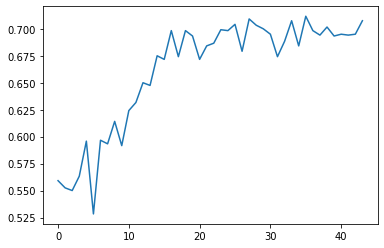

In [217]:
plt.plot(acc)

In [ ]:
curr_acc = test(dataloader['test'])

In [218]:
data, label = next(iter(dataloader['test']))

In [219]:
output = model.stn(data[0], data[1])

tensor([0.2932, 0.2656], grad_fn=<SelectBackward0>)


In [220]:
with torch.no_grad():
    cat, theta, z, _, _ = model(data[0], data[1])
cat = torch.argmax(F.softmax(cat),1)

tensor([0.3058, 0.0329])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


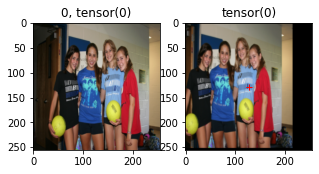

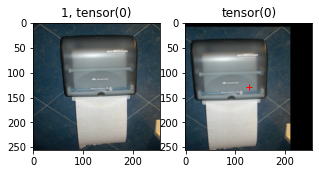

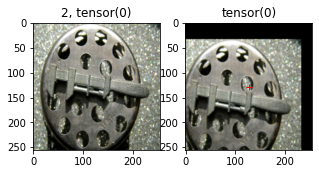

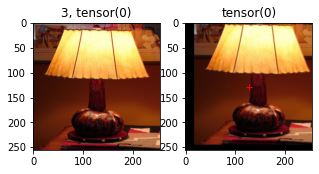

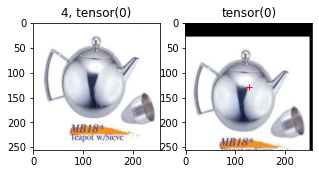

...

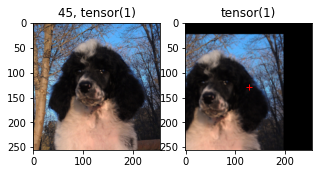

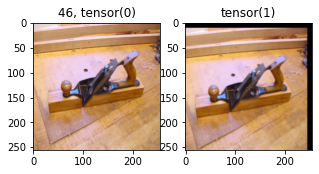

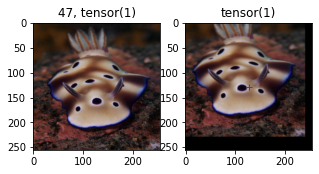

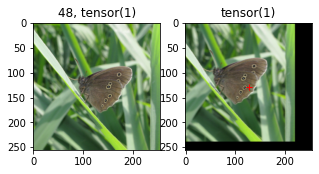

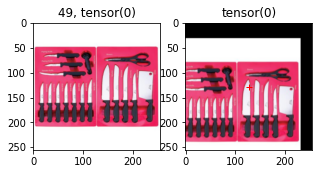

In [221]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
        
        #theta = theta.view(-1, 2, 3)
for num in range(50):
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 256, 256])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(str(num)+', '+str(label[num]))
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(128,128,'r+')
    plt.title(cat[num])

tensor([0.2057, 0.0897])
tensor([0.2113, 0.0994])
tensor([ 0.3127, -0.2145])
tensor([ 0.2486, -0.0783])
tensor([ 0.2907, -0.3142])
tensor([ 0.4297, -0.1859])
tensor([0.2124, 0.0173])
tensor([0.2818, 0.2259])
tensor([ 0.3247, -0.2734])
tensor([0.3610, 0.1616])
tensor([0.2273, 0.0611])
tensor([ 0.0959, -0.0982])
tensor([ 0.3861, -0.0033])
tensor([0.4460, 0.2022])
tensor([ 0.1253, -0.2975])
tensor([ 0.1772, -0.0992])
tensor([ 0.1647, -0.1803])
tensor([ 0.3204, -0.0568])
tensor([-0.0613,  0.0324])
tensor([ 0.3335, -0.0829])
tensor([0.2472, 0.1626])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


tensor([ 0.3341, -0.0983])
tensor([ 0.4158, -0.2205])
tensor([0.2308, 0.1339])
tensor([0.2408, 0.1342])
tensor([0.3039, 0.0848])
tensor([ 0.1912, -0.0048])
tensor([0.4499, 0.1483])
tensor([0.3065, 0.0617])
tensor([0.0586, 0.0024])
tensor([ 0.5940, -0.1090])
tensor([0.2582, 0.0865])
tensor([0.2130, 0.1594])
tensor([0.2456, 0.0191])
tensor([0.2045, 0.1305])
tensor([ 0.4113, -0.0906])
tensor([ 0.3903, -0.0282])
tensor([ 0.1676, -0.0990])
tensor([ 0.2016, -0.0207])
tensor([0.1664, 0.0697])
tensor([ 0.2340, -0.0098])
tensor([ 0.1446, -0.0100])
tensor([0.5401, 0.2156])
tensor([0.3431, 0.3066])
tensor([0.2866, 0.0288])
tensor([ 0.3481, -0.1439])
tensor([ 0.3800, -0.0074])
tensor([0.1622, 0.2180])
tensor([-0.0062,  0.1409])
tensor([ 0.1156, -0.0689])


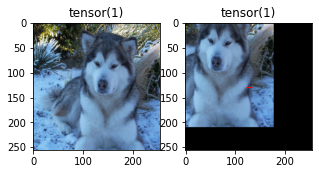

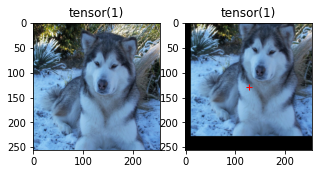

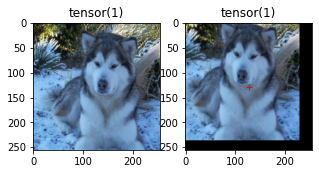

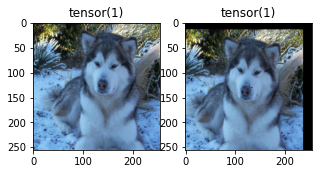

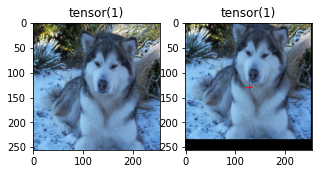

...

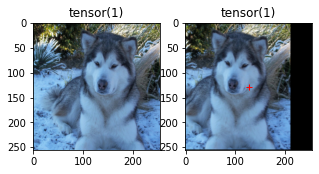

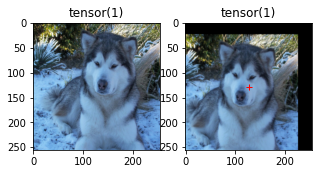

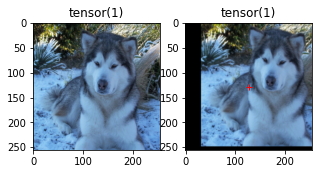

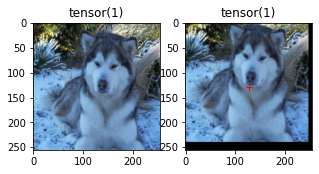

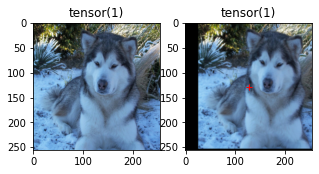

In [222]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
mem_z  = []
mem_cat  = []

        #theta = theta.view(-1, 2, 3)
for num in [43,]*50: #range(50):
    with torch.no_grad():
        #img = data[0][num,...].unsqueeze(0)
        #polo_img = {'in': data[1]['in'][num,...].unsqueeze(0),
        #             'out': data[1]['out'][num,...].unsqueeze(0)}
        cat, theta, z, _, _ = model(data[0], data[1])
    cat = torch.argmax(F.softmax(cat),1)
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    mem_z.append(z)
    mem_cat.append(cat)
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 256, 256])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(label[num])
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(128,128,'r+')
    plt.title(cat[num])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


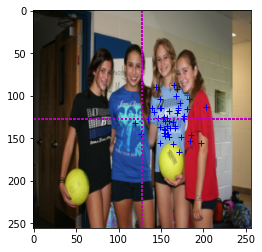

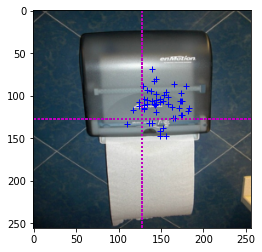

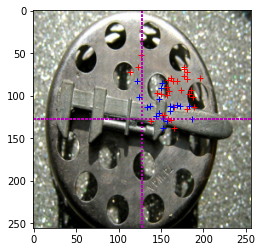

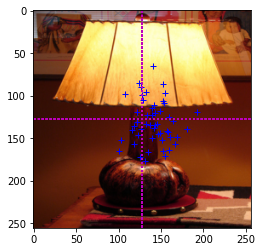

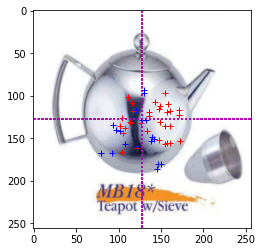

...

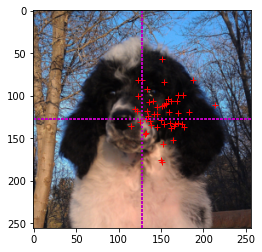

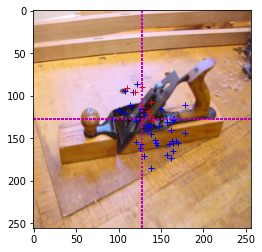

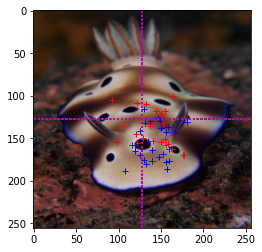

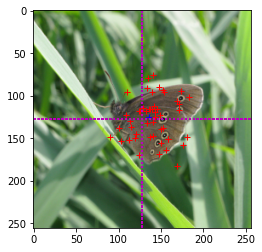

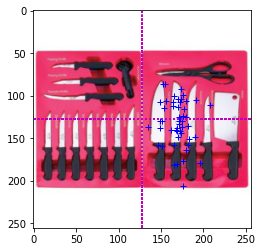

In [223]:
for num in range(batch_size):
    plt.figure()
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    for i, z in enumerate(mem_z):
        if mem_cat[i][num] == 1:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'r+')
        else:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'b+')
        plt.plot((127.5, 127.5), (0.5, 255.5), 'm:')
        plt.plot((0.5, 255.5), (127.5, 127.5), 'm:')

In [224]:
cat[48]

tensor(1)

In [225]:
mem_z[18:19]

[tensor([[-0.0613,  0.0324],
         [ 0.1118, -0.1359],
         [ 0.1983, -0.0102],
         [ 0.1088,  0.0848],
         [ 0.0822,  0.2038],
         [ 0.1624, -0.0214],
         [ 0.2992,  0.1552],
         [-0.1114,  0.2062],
         [ 0.0308, -0.1289],
         [ 0.1935,  0.2097],
         [ 0.3946,  0.2589],
         [ 0.4755,  0.2541],
         [ 0.0770, -0.1037],
         [ 0.0752, -0.3395],
         [ 0.0775,  0.1410],
         [ 0.1432, -0.6365],
         [-0.0900, -0.1306],
         [ 0.2162,  0.3166],
         [-0.4560, -0.2092],
         [ 0.1343, -0.0065],
         [ 0.2897,  0.0693],
         [ 0.1424,  0.1400],
         [ 0.0272,  0.0026],
         [ 0.2208, -0.0188],
         [ 0.1597,  0.0254],
         [ 0.3767, -0.0055],
         [ 0.1585,  0.0157],
         [-0.0169, -0.1504],
         [ 0.4821, -0.1427],
         [ 0.1242,  0.1021],
         [ 0.3392,  0.1530],
         [-0.0911, -0.0235],
         [ 0.4307,  0.2628],
         [ 0.3971,  0.1792],
         [ 0.1

In [226]:
len(mem_z)

50

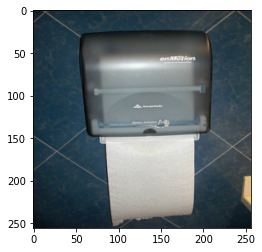

In [227]:
plt.imshow(data[0][1,:].permute(1,2,0).detach().numpy())

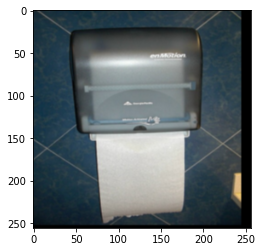

In [228]:
plt.imshow(output[0][1,:].permute(1,2,0).detach().numpy())

In [229]:
output[1][1][:,2].detach().numpy()

array([0.0895914 , 0.02733606])